In [3]:
# Imports
from SIMuLDiTex.SIMuLDiTex import Unet, GaussianDiffusion, Trainer
from torchvision.utils import make_grid,save_image
from PIL import Image
import cv2
import numpy as np
import torch,torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from SIMuLDiTex.ResizeRight import resize
import SIMuLDiTex.interp_methods as interp
from IPython.display import clear_output
import time, os, json, re

def n_params(model):
    pp=0
    for p in list(model.parameters(True)):
        nn=1
        for s in list(p.size()):
            nn = nn*s
        pp += nn
    return pp

def get_latest_model_index(directory):
    files = os.listdir(directory)
    model_files = [f for f in files if re.match(r'model-(\d+)\.pt', f)]
    indices = []
    for model in model_files:
        match = re.match(r'model-(\d+)\.pt', model)
        if match:
            indices.append(int(match.group(1)))
    if indices:
        return max(indices)
    else:
        return None

os.makedirs('./images/results/gif_frames',exist_ok=True)
clear_output()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056088746..1.0335343].


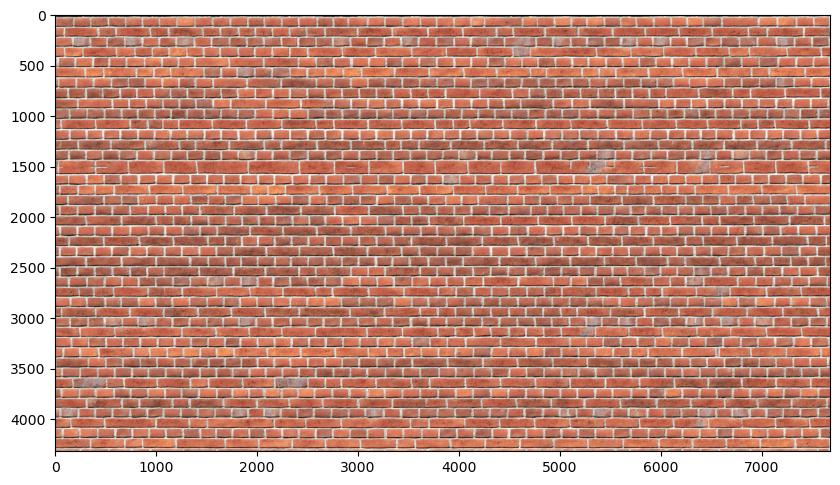

In [4]:
#inference

# ---------- Parameters ----------

name = 'wall'         # 'grass' 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16               # 16, 32    for 1M or 4M parameters
S = 5                 # Sampling steps
r = .8                # renoising time ratio
hm = True             # Histogram matching, as described in the paper
patch_size=4096       # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
size = (4320,7680)    #(4096,4096)
seed = None

# --------------------------------


folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name,nc)

model = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)

diffusion = GaussianDiffusion(
    model,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)

trainer = Trainer(
    diffusion,
    'images/data/%s'%name,
    results_folder=folder)

print(n_params(model))
trainer.load(get_latest_model_index(folder))
gt=trainer.ds.images[0][0].unsqueeze(0)


im=diffusion.ms_gen(batch=1,size=size,gt=gt,time_ratio=r,histogram_matching=hm,patch_size=patch_size,seed=seed).cpu()
clear_output()
plt.figure(figsize=(10,10))
plt.imshow(im[0].permute(1,2,0))

save_image(im,'./images/results/%s_S_%d_r_%.2f_%d_%d.png'%(name,S,r,size[0],size[1]))




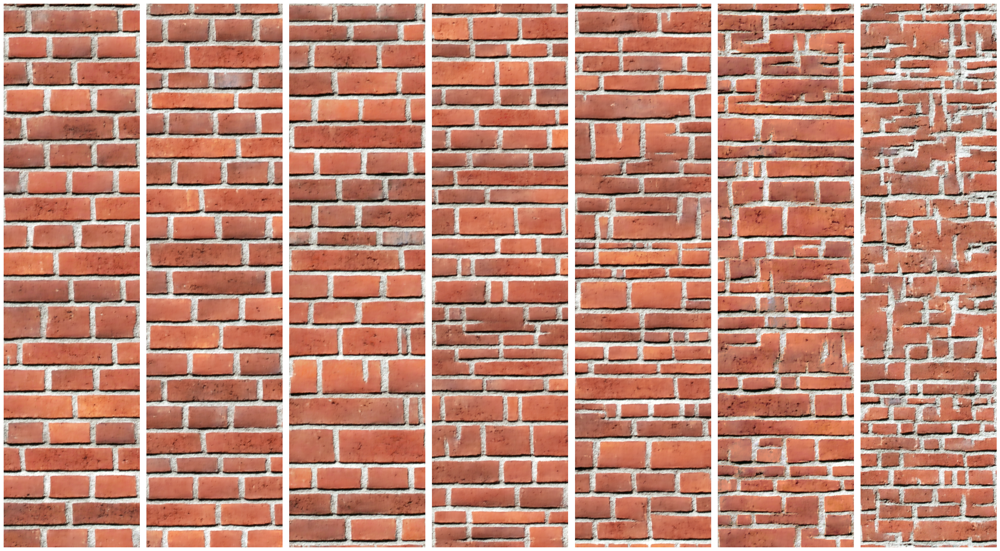

In [ ]:
# Synthesis with a subset of the multi-resolution pyramid: starting generation at an increasingly fine resolution leads to a degradation of structures 

# ---------- Parameters ----------

name = 'wall'         # 'grass' 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16               # 16, 32    for 1M or 4M parameters
S = 5                 # Sampling steps
r = .8                # renoising time ratio
hm = True             # Histogram matching, as described in the paper
patch_size=4096       # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
size = (4096,4096)
seed = None

# --------------------------------


folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name,nc)

model = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)

diffusion = GaussianDiffusion(
    model,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)

trainer = Trainer(
    diffusion,
    'images/data/%s'%name,
    results_folder=folder)

trainer.load(get_latest_model_index(folder))
gt=trainer.ds.images[0][0].unsqueeze(0)


fig, axs = plt.subplots(1, 7, figsize=(35, 20), gridspec_kw={'wspace': 0.05, 'hspace': 0})

for n, ax in enumerate(axs):
    im = diffusion.ms_gen(size=(2048, 512), gt=gt, time_ratio=r, histogram_matching=hm, patch_size=patch_size, seed=seed, drop_last_n_resolutions=n, disable=False).cpu()
    ax.imshow(im[0].permute(1, 2, 0))
    ax.axis('off') 
    clear_output()
plt.show()


In [ ]:
# Interpolation between textures to make a gif

# ---------- Parameters ----------

names=['carpet','crepe','wall','rust']      # Textures to interpolate: 'grass' 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16                                     # 16, 32    for 1M or 4M parameters
S = 5                                       # Sampling steps
r = .8                                      # renoising time ratio
patch_size=4096                             # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
steps= 11                                   # number of linear interpolation steps between two consecutive textures
downscale_factor= 0.25                      # downscaling factor for reasonable size gif
size = (2048,2048)
seed = 0


# --------------------------------


image_paths=[]

for i  in range(len(names)):

    folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(names[i%4],nc)

    model1 = Unet(
        dim =nc,
        dim_mults = (1, 2, 4, 4),
        mid_fourier=True)
    diffusion1 = GaussianDiffusion(
        model1,
        image_size = 128,
        timesteps = 200,
        sampling_timesteps=S)
    trainer1 = Trainer(
        diffusion1,
        'images/data/%s'%names[(i)%4],
        results_folder=folder)
    trainer1.load(get_latest_model_index(folder))


    folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(names[(i+1)%4],nc)

    model2 = Unet(
        dim =nc,
        dim_mults = (1, 2, 4, 4),
        mid_fourier=True)
    diffusion2 = GaussianDiffusion(
        model2,
        image_size = 128,
        timesteps = 200,
        sampling_timesteps=S)
    trainer2 = Trainer(
        diffusion2,
        'images/data/%s'%names[(i+1)%4],
        results_folder=folder)
    trainer2.load(get_latest_model_index(folder))

    diffusion1.model2=model2


    for omega in torch.linspace(0,1,steps)[:-1]:
        im=diffusion1.ms_gen(size=size,time_ratio=r,omega=omega,seed=seed)
        image_path = f'./images/results/gif_frames/interp_{(i+omega)/len(names):.2f}.jpg'
        save_image(resize(im,scale_factors=downscale_factor), image_path)
        image_paths.append(image_path)
        clear_output()

images = [Image.open(image_path) for image_path in image_paths]
gif_path = './images/results/interpolation.gif'
images[0].save(gif_path, save_all=True, append_images=images[1:], loop=20, duration=200)

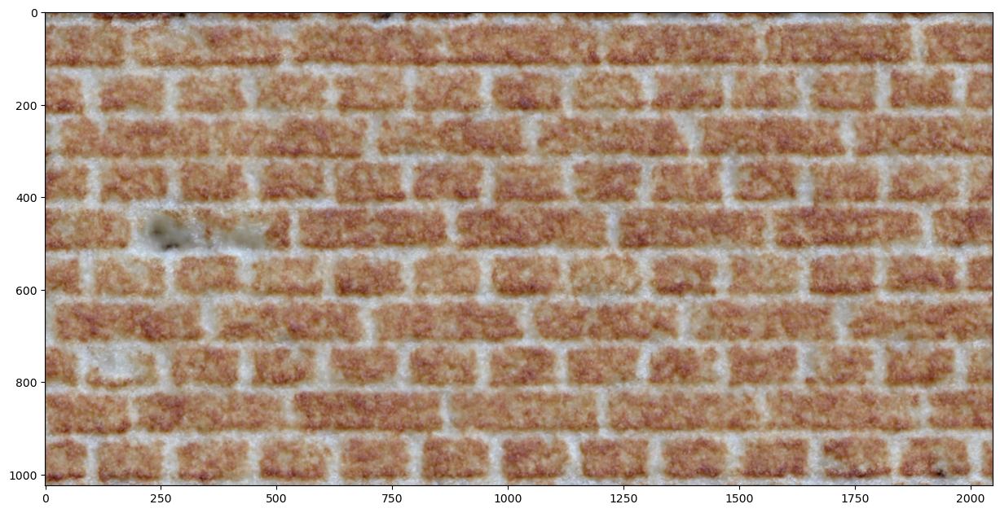

In [28]:
#Interpolate two images: first one gives structure (coarse scales) the second one gives texture (fine scales)
# play with renoise ratio r to control strenght of stylization 

# ---------- Parameters ----------

name1,name2 = 'wall','crepe'      # 2 textures to interpolate: 'grass' 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16                                     # 16, 32    for 1M or 4M parameters
S = 5                                       # Sampling steps
r = .6                                      # renoising time ratio
size = (1024,2048)

# --------------------------------



folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name1,nc)

model1 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion1 = GaussianDiffusion(
    model1,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer1 = Trainer(
    diffusion1,
    'images/data/%s'%name1,
    results_folder=folder)
trainer1.load(get_latest_model_index(folder))


folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name2,nc)

model2 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion2 = GaussianDiffusion(
    model2,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer2 = Trainer(
    diffusion2,
    'images/data/%s'%name2,
    results_folder=folder)
trainer2.load(get_latest_model_index(folder))

diffusion1.model2=model2


image_paths=[]

im=diffusion1.interp_scale(size=size,time_ratio=r)
image_path = './images/results/interp_scale_%s_%s.png'%(name1,name2)
save_image(im, image_path)
clear_output()
plt.figure(figsize=(15,15))
plt.imshow(im[0].permute(1,2,0).cpu())
plt.show()


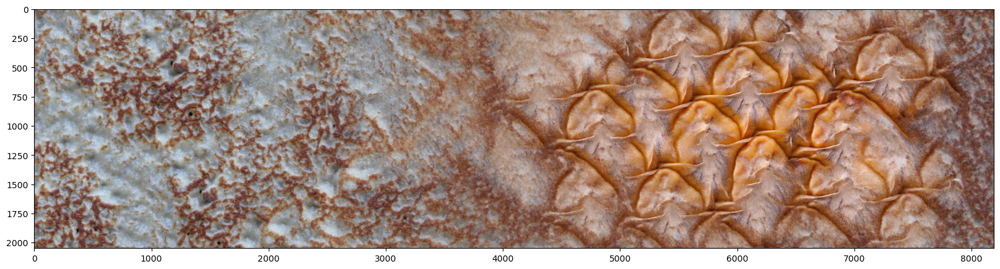

In [ ]:
# Spatial linear interpolation between two textures


# ---------- Parameters ----------

name1,name2 = 'crepe','ananaskin'               # 2 textures to interpolate: 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16                                     # 16, 32    for 1M or 4M parameters
S = 5                                       # Sampling steps
r = .5                                      # renoising time ratio
patch_size=4096                             # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
size = (2048,8192)


# --------------------------------



folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name1,nc)

model1 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion1 = GaussianDiffusion(
    model1,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer1 = Trainer(
    diffusion1,
    'images/data/%s'%name1,
    results_folder=folder)
trainer1.load(get_latest_model_index(folder))


folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name2,nc)

model2 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion2 = GaussianDiffusion(
    model2,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer2 = Trainer(
    diffusion2,
    'images/data/%s'%name2,
    results_folder=folder)
trainer2.load(get_latest_model_index(folder))

diffusion1.model2=model2



omega=torch.tensor([0.,1]).unsqueeze(0).unsqueeze(0).unsqueeze(0)
im=diffusion1.spatial_interp(size=size,time_ratio=r,omega=omega,patch_size=patch_size)
clear_output()
plt.figure(figsize=(20,15))
plt.imshow(im[0].permute(1,2,0).cpu())
plt.show()
save_image(im, './images/results/spatial_interp_%s_%s.jpg'%(name1,name2))


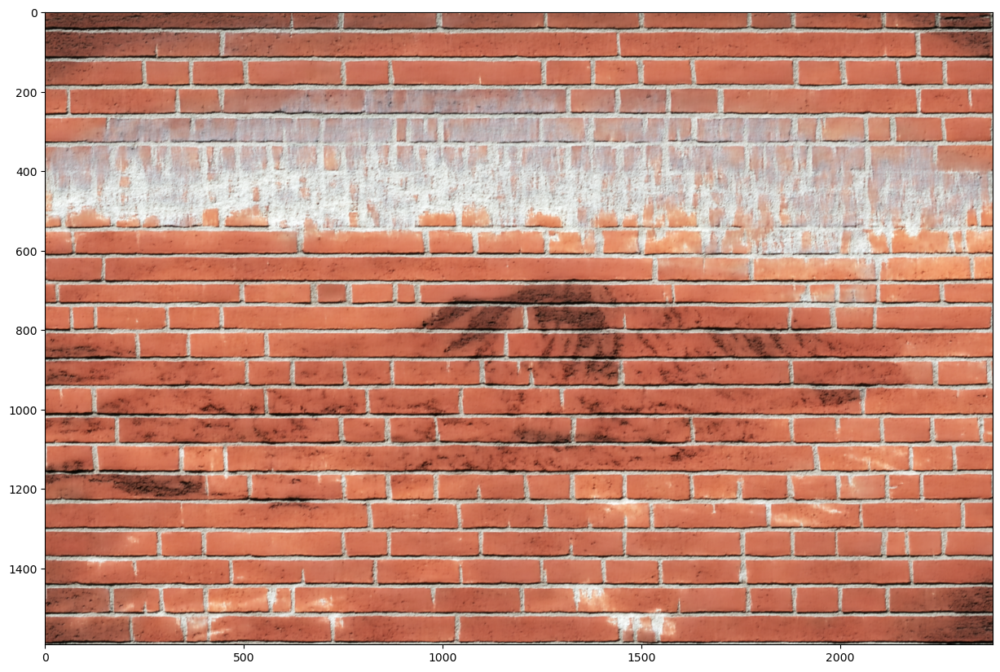

In [ ]:
# Stylization


# ---------- Parameters ----------

name = 'wall'                               # texture source
content_pth = './images/iccv_honolulu.jpg'  # path to content image
zeta = 0.03                                 # controls the strengh of the data fidelity
res = 1                                     # controls the relative size of texture patterns in the output image. Higher value will give an impression of zoom out of the texure. 
nc = 16                                     # 16, 32    for 1M or 4M parameters
S = 5                                       # Sampling steps
r = .9                                      # renoising time ratio
patch_size = 46                             # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
zoom_factor = 2


# --------------------------------



folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name,nc)

model = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion = GaussianDiffusion(
    model,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer = Trainer(
    diffusion,
    'images/data/%s'%name,
    results_folder=folder)
trainer.load(get_latest_model_index(folder))

gt=trainer.ds.images[0][0].unsqueeze(0)
input=transforms.ToTensor()(Image.open(content_pth)).unsqueeze(0)


im=diffusion.stylize(size=(input.shape[-2]*zoom_factor,input.shape[-1]*zoom_factor),input=input,gt=gt,zeta=.1,output_texture_resolution_ind=res,time_ratio=r)
clear_output()
plt.figure(figsize=(15,15))
plt.imshow(im[0].permute(1,2,0).cpu())
plt.show()
save_image(im, './images/results/Stylization_zeta_%.2f_zoom_%d_res_%d.jpg'%(zeta,zoom_factor,res))


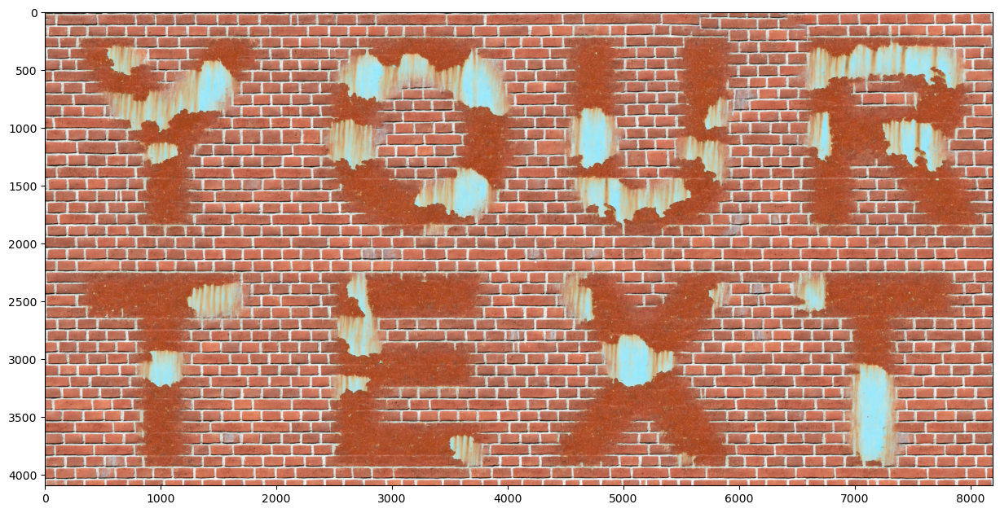

: 

In [ ]:
# Writing text with two textures as font and background


# ---------- Parameters ----------



name1,name2 = 'wall','rust'                 # 2 textures for background anbd font: 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2','gold'
nc = 16                                     # 16, 32    for 1M or 4M parameters
S = 5                                       # Sampling steps
r = .8                                      # renoising time ratio
patch_size=3000                             # Maximum side of patches used if inference triggers memory error, to lower in case this happens.
char_size = 2048                            # character size
string='your_text'                          # use '_' to break line, all lines must have the same number of caracters, you can use blanks ' '
dilation = 5                                # iterations of morphological dilation on caracters mask

# --------------------------------

size=( (string.count('_')+1) * char_size , string.find('_')*char_size if string.find('_')!=-1 else len(string)*char_size)




folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name1,nc)

model1 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion1 = GaussianDiffusion(
    model1,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer1 = Trainer(
    diffusion1,
    'images/data/%s'%name1,
    results_folder=folder)
trainer1.load(get_latest_model_index(folder))


folder='runs/%s_lr1e-4_bs32_T200_100000_dim%d_octaves_3/'%(name2,nc)

model2 = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    mid_fourier=True)
diffusion2 = GaussianDiffusion(
    model2,
    image_size = 128,
    timesteps = 200,
    sampling_timesteps=S)
trainer2 = Trainer(
    diffusion2,
    'images/data/%s'%name2,
    results_folder=folder)
trainer2.load(get_latest_model_index(folder))

diffusion1.model2=model2



# create mask 
width=21
sigma=5
kernel_size = [width,width] 
kernel = 1
mgrids = torch.meshgrid([torch.arange(size, dtype=torch.float32) for size in kernel_size])
kernel=(mgrids[0]-(kernel_size[0] - 1) / 2)**2+(mgrids[1]-(kernel_size[1] - 1) / 2)**2
kernel=torch.exp(-kernel/sigma**2)
kernel = kernel / torch.sum(kernel)
kernel = kernel.view(1, 1, *kernel.size())
conv = torch.nn.Conv2d(1,1, kernel_size, groups=1, bias=False, stride=1, padding=int((kernel_size[0] - 1) / 2), padding_mode='replicate')
conv.weight.data = kernel
conv.weight.requires_grad = False
conv.cuda()
kernel = np.ones((3,3),np.uint8)
mask=None
mask_list=[]
for i,s in enumerate(string.upper()):

    if s=='_':
        if mask is None:
            mask=torch.cat(mask_list,dim=-1)
        else:
            mask=torch.cat((mask,torch.cat(mask_list,dim=-1)),dim=-2)
        mask_list=[]

    elif s==' ':
        mask_letter=0.*transforms.ToTensor()(cv2.dilate(np.array(Image.open('./images/letters/1.png')),kernel,iterations = dilation)).unsqueeze(0)
        mask_list.append(mask_letter)
    else:
        mask_letter=transforms.ToTensor()(cv2.dilate(np.array(Image.open('./images/letters/%s.png'%s)),kernel,iterations = dilation)).unsqueeze(0)
        mask_list.append(mask_letter)
if mask is None:
    mask=torch.cat(mask_list,dim=-1)
else:
    try:
        mask=torch.cat((mask,torch.cat(mask_list,dim=-1)),dim=-2)
    except:
        pass


omega=mask.cuda()
omega=conv(omega).cpu()
save_image(omega[0],'./images/results/%s_mask.jpg'%string)

im=diffusion1.spatial_interp(size=size,time_ratio=r,omega=omega,patch_size=patch_size)
clear_output()
plt.figure(figsize=(15,15))
plt.imshow(im[0].permute(1,2,0).cpu())
plt.show()
save_image(im, './images/results/%s_%s_%s_32.jpg'%(string,name1,name2))

        


In [ ]:
#train from notebook

# ---------- Parameters ----------
 
name = 'wall'              # 'wall' 'carpet' 'rust' 'crepe' 'ananaskin' 'ananaskin2'
nc = 16                    # 16, 32    for 1M or 4M parameters 
bs = 32                    # batch size 
crop_size = 128            # size of images seen by the network
T = 200                    # Number of diffusion timesteps
desc= '%s_nc_%d'%(name,nc) # Name of the experiment in ./runs/
training_steps = 20000
confirmation = True       # sure you want to train from the notebook interface?

# --------------------------------


model = Unet(
    dim =nc,
    dim_mults = (1, 2, 4, 4),
    flash_attn = False,
    mid_attn=False,
    mid_fourier=True
)
diffusion = GaussianDiffusion(
    model,
    image_size = crop_size,
    timesteps = T,           # number of steps
    sampling_timesteps = T,
)
trainer = Trainer(
    diffusion,
    './images/data/%s/'%name,
    results_folder='./runs/%s'%desc,
    train_batch_size = 32,
    train_lr = 1e-4,
    train_num_steps = training_steps,         # total training steps
    gradient_accumulate_every = 1,    # gradient accumulation steps
    ema_decay = 0.995,                # exponential moving average decay
    amp = True,                       # turn on mixed precision
    calculate_fid = False,         # whether to calculate fid during training
    save_and_sample_every=5000)
print('Model has %.1f M parameters'%(n_params(model)*10**-6))

if confirmation:
    trainer.train()
